# Image Captioning for the Hindi language
## By Sayali Ghodekar (smg2280)

# Objective 
Image Captioning is the method to describe the contents, situation, relationships between objects in an image through a well-composed and brief sentence i.e. “caption”. Image captioning has proven to be useful for a variety of applications such as content-based information retrieval, social media communications, virtual assistants, for visually impaired people and similar such parallel NLP/CV tasks. It is one of the core themes for multimedia analysis and retrieval. 

Most work in image captioning is done either in English or other high-resource languages. However, due to the tremendous growth of multimedia content in other languages, it becomes increasingly important that the problem of image captioning be extended to the multilingual domain. In this project, we tackle the problem of image captioning in a low-resource setting for the Hindi language. 

Due to the lack of an existing Hindi-captions dataset, we generate our own dataset by using machine translation models and the Flickr-8k dataset. We manually verify the labels generated by translation and annotate the images where we feel the translation is incorrect. We experiment with various encoder-decoder-based models to generate Hindi captions. We also experiment with multilingual tokenizers and transformer-based models to help improve the image and textual features. 

**Our novel contribution in this project is the proposal and curation of the “Hindi-captions in Indian Context” dataset.** Our goal was to improve the model accuracy for the Hindi language and capture the complexities specific to the language. Hence we curate approximately 200 images based on variety of Indian contexts and annotate them manually. We plan to release our dataset publicly.

Furthermore, our experiments with this dataset **improve the BLEU score by approximately 33% compared to the baseline.**

# Challenges
This field is particularly challenging as it requires us to combine Computer Vision techniques with Natural language processing. We can frame the problem as finding the relationship (or translation) between two distinct modalities (image, text). Moreover in the real world, humans use common-sense knowledge, experience and imagination to describe images, and hence this task becomes particularly challenging to be solved by traditional Computer vision techniques. The primary objective of image captioning techniques is to bridge the semantic gap between image and language to produce natural, human-like captions. Another challenge arises from dataset biases, where models tend to overfit to common objects in common environments. [6]
For example, a surfer surfing on waves is a common datapoint as compared to a surfer standing on a beach.

Since we are dealing with the problem of captioning in a low-resource language, the lack of data poses a major challenge. Currently, there is no dataset available

## NOTE: In every section, I have highlighted the parts that I have worked vs my project partner. (Shikha: sar864)

## GitHub Repo Link of our project : https://github.com/ShikhaAsrani/DLCV_Final_Project

# Datasets                                 (Sayali + Shikha)
We use the following datasets for our experiments.


- **Flickr 8K (Baseline Dataset):** Most commonly used dataset for image captioning. Contains 8000 images collected from Flickr, along with 5 reference sentences provided by human annotators. Contains clear descriptions of entities and events. 
    **Download Source :**  [https://www.kaggle.com/adityajn105/flickr8k]
    The original Flickr-8k dataset is in English and we use various translation libraries to convert the captions into Hindi. We use 90% of the data for training and the rest for testing.
    
## - **"Hindi Captions in Indian context"  (Novel dataset)**
We observe that even though translating Flickr8k captions provides decent captions, there are various events and situations that are language-specific. Hindi is a morphologically and semantically rich language and to capture such language-specific words and complexities, we feel the need to curate a Hindi captions dataset. Furthermore, to make captions more specific to the language we choose images that represent entities and scenarios in an Indian context. For example, the model trained on Flickr8k will not be able to capture a scenario like “people celebrating the festival of Holi”.

We start with manually annotating **~200 images** that we curate from bing web-crawl. We choose **~50 topic categories**, specific to the Indian context and annotate a few samples from each category. Our image-topic categories include **“Bollywood”** (Indian film industry), **‘Diwali“** (Indian festival), **“Cricket”** (Indian sports), **‘Holi“, “Salwar”** (Indian outfit), **“Bharatnatyam”** (Indian dance forms). 
We not only use Indian objects as images, but also complex scenarios that capture the entire scene (eg: **“A woman praying to Goddess Durga in a temple.”**)

We use the **Heartex** annotation tool as it provides a clean labeling interface with custom templates for Image captioning.
**Source : https://heartex.com/**
We have **2 annotators (Sayali, Shikha)** and we each label ~100 captions in Hindi. We use 10% of the dataset for testing.

**We make at dataset public at**
Dataset Source : [https://github.com/ShikhaAsrani/DLCV_Final_Project]

# Translation
## Google Translate  API                                      (Shikha)

This API uses Google’s internal Neural Machine Translation technology and provides an End-to-End Framework. It has less processing overhead compared to our second library DL-translate.It works well with low-resource languages and has features such as language detection, spelling correction, and language correction.



## DL-Translate                                                  (Sayali)


This is a deep-learning based translation library built on the top of  Hugging-face transformers. It has support for over 50 languages and auto-complete support. It is built using torch and provides GPU support for accelerating the speed of translations for larger files. 

The models are trained using Facebook’s **MBART50 Large and M2M100**. The MBART50 is the multilingual version of BART trained on a huge multilingual corpus for over 50 languages. M2M100 is an extension of MBART having a support for ~100 languages. For our experiments, we use MBART50 model with Punkt nltk tokenizer. 

Library link : https://github.com/xhlulu/dl-translate



**Note**: We manually compare the translation qualities produced by Google translate and DL-translate and proceed to choose the captions generated by Google API due to less processing overhead, even though both produce similar results.

## Results of Translation model
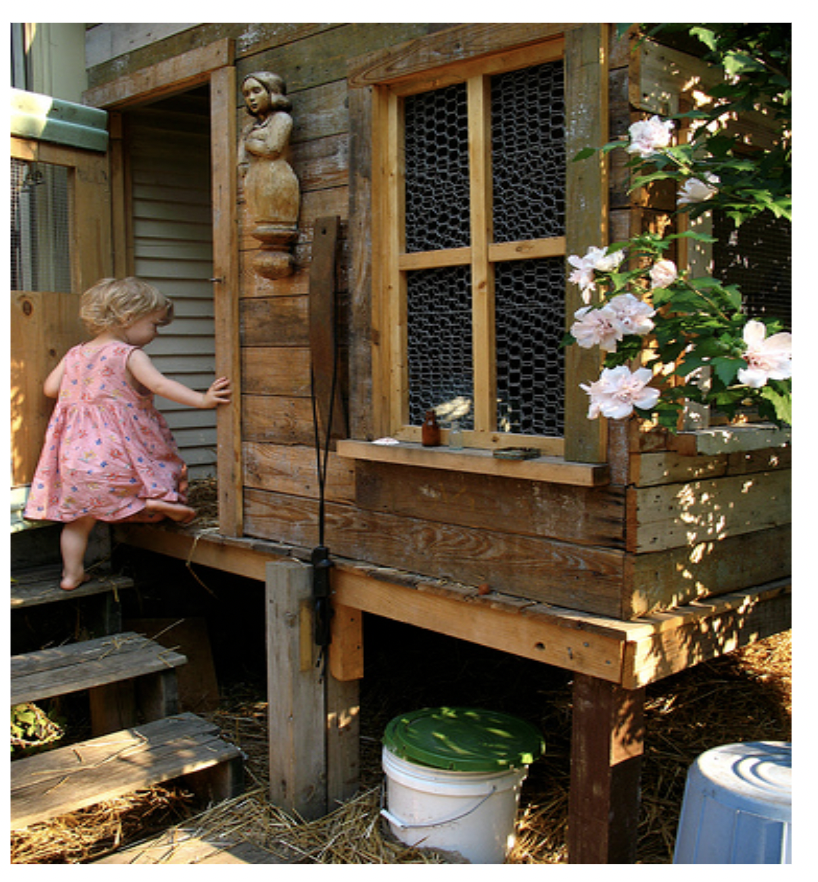

A child in a pink dress is climbing up a set of stairs in an entry way .
गुलाबी पोशाक में एक बच्चा प्रवेश मार्ग में सीढ़ियों के एक सेट पर चढ़ रहा है।


A girl going into a wooden building .
लकड़ी की इमारत में जा रही एक लड़की।


A little girl climbing into a wooden playhouse .
लकड़ी के प्लेहाउस में चढ़ती एक छोटी लड़की।

A little girl climbing the stairs to her playhouse .
एक छोटी बच्ची सीढ़ियाँ चढ़कर अपने प्लेहाउस की ओर जा रही है।


A little girl in a pink dress going into a wooden cabin.
गुलाबी पोशाक में एक छोटी लड़की लकड़ी के केबिन में जा रही है।


# Image Feature Extraction

The image captioning models require us to encode visual concepts along with semantics encodings from text. 
We perform feature extraction using the following variants of CNN model, Inception V3, VGG16 and ResNet50. We use the pretrained model weights and remove the last layer to extract image features. 


- InceptionV3  - 2048 features         (Sayali)                                
- ResNet50 - 1000 features			(Sayali)     
- VGG16 - 4096 features				(Shikha)     


We demonstrate in our next section that VGG16 outperforms the other two models and greater dimension of input features could contribute to the improved accuracy.
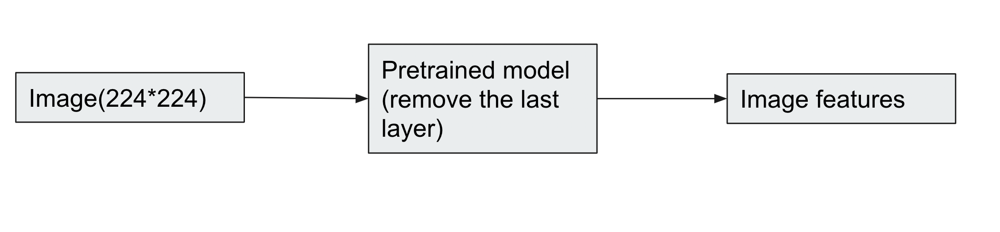


# Feature Extraction from Text Corpus

## Using Keras Tokenizer                (Sayali)

 We use the Keras tokenizer and fit the training corpus on the tokenizer. It converts the text into a sequence of integers. We use the method tokenizer.texts_to_sequence. We also pad input sequences according to max length and convert the output sequences into the binary class matrix. We then create a Keras Embedding layer based on the input sequences. 

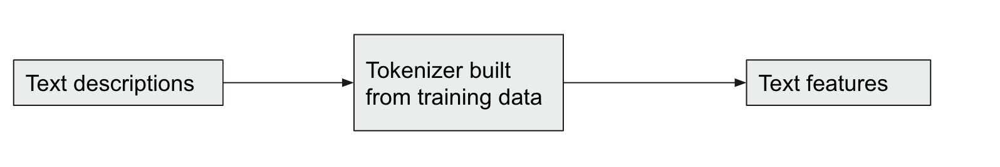




## Using Multilingual BART (Failed experiment)         (Shikha)

We also experiment with the underlying tokenizer and replacing with a multilingual variant of the tokenizer model. We use MBART for this purpose. MBART is a sequence-to-sequence denoising auto-encoder pretrained on large-scale monolingual corpora in many languages using the BART objective.
Our expectation was that since the MBART is trained on massive multilingual corpora, it will improve the textual features generated from text.

**Note:** We could not use MBART tokenizer in our final model as we hitting memory issues while model training. (MBART is a large model and freezing embedding layers did not work)



# Model                  (Sayali and Shikha)

The following diagram shows the model architecture we used. We are using the encoder-decoder layers with a classifier to train the model. The two main components of our model are the **Image extraction encoder** and the **Textual endocer.** 

The image encoder takes the input image features generated from pretrained networks (VGG16, Inception and ResNet) and adds a Dropout and a Dense layer before feeding these features into the LSTM decoder model. 

Parallelly, the textual encoder takes the textual features generated from the embedding layer, adds dropout and encodes the sequences using 2 stacked LSTM layers. We also add a time-distributed Dense layer to manipulate the shape of tetxual encodings generated.

Finally the Deocder model tries to reconstructs the captions using the textual and image encodings from the above 2 encoders. We implement a simple LSTM model with Dropout and Dense layers for the decoder.

To train the classifier we have used **Categorical Cross-Entropy loss.**

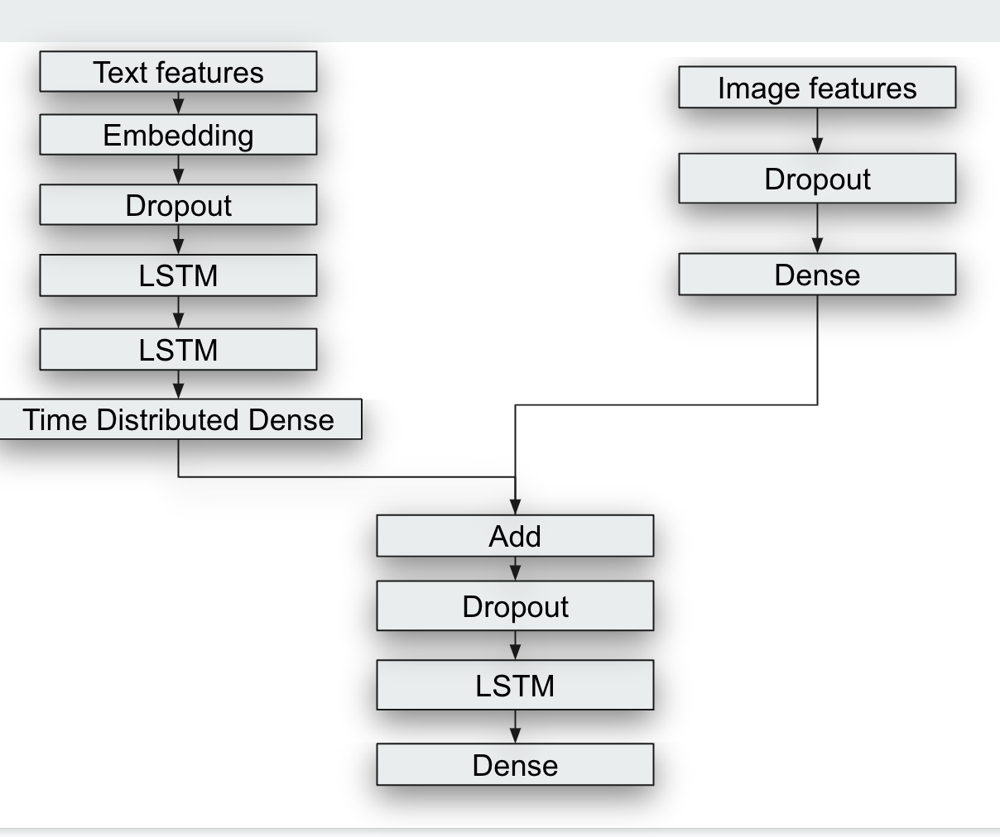

# Model Training 

We conduct 3 baseline training and 1 finetuning  experiment for our project

Flickr8k baseline experiments                           (Shikha)
### 1. Using Inception V3 features
### 2. Using ResNet50
### 3. Using VGG16 features

We observe that (further elaborated in the model evaluation section), the VGG16 model gives the best performance out of the three, so we continue to finetune the VGG16 model with our custom dataset.

### 1.  Hindi Captions in Indian Context finetuning experiment with VGG16             (Sayali)

**Training hyperparameters:**
For training, we use **80%** of the entire dataset for both baseline training and finetuning. The objective function used to train the classifier is **“categorical cross entropy loss”,** with adam optimizer. We train the model for **40 epochs with a 0.01 learning rate.** We used batch size of 32 with 6 worker threads. The model training took approx 30 minutes to train a VGG16 model on a single NVIDIA Tesla T4. 

**Implementation and modification:** 
We have built our model on top of the available open-source code provided by [https://github.com/rathiankit03/ImageCaptionHindi]
Modifications:
We make several modifications to the data preprocessing and feature extraction code to make it compatible with Filckr8k and our custom dataset. The given code does not work well with tensorflow-gpu. Hence we add a custom “DataGenerator” (to generate batches) and multiprocessing logic to utilize the GPUs available. 


# Model Evaluation                            (Sayali + Shikha)

#### This work was performed jointly by the two of us. 
# Quantitative evaluation - BLEU score
 
To evaluate the model accuracy we use the BLEU (Bilingual Evaluation Understudy) score. In our implementation, we use nlkt’s corpus_bleu method. 
### For baseline experiments
The following table summarizes the BLEU scores for the Flickr8k test dataset.

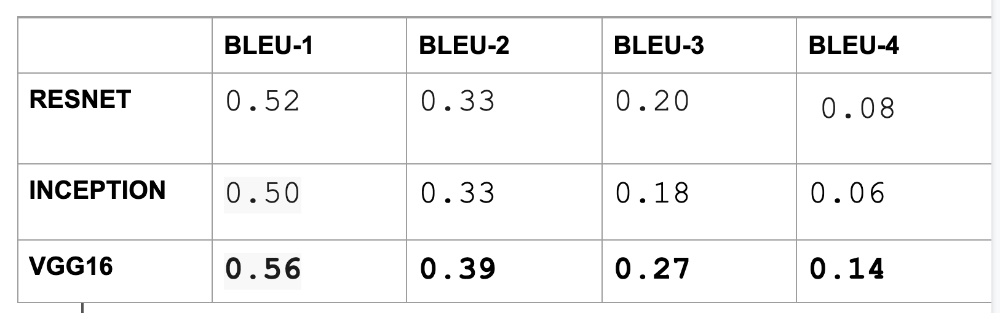

### For finetuning experiments (custom dataset)
We can see from the above table that the VGG16 model outperforms the other two models in terms of all BLEU scores. The increased number of features in the last layer could be an explanation of the increased accuracy of the BLEU score. 

Since VGG16 performs the best, to evaluate our custom dataset, we use the same model. The following table denotes BLEU scores for “Hindi captions in Indian context” test dataset with the baseline VGG model and our fine-tuned version.

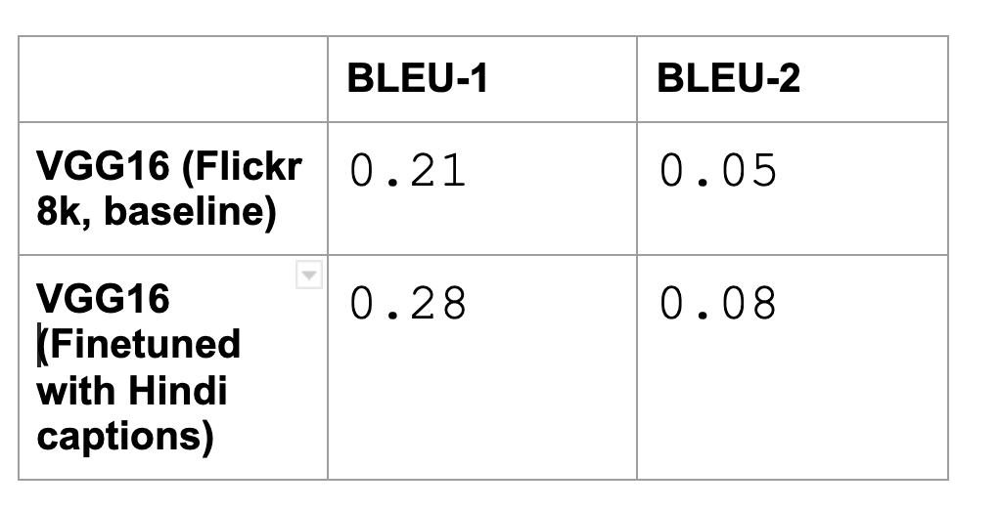

From the above table, we can see that finetuning the model with our custom dataset, has an improvement of **33% in the BLEU score.**


# Qualitative evaluation - Model predictions

#### Note: This Notebook contains evaluation and prediction code with sample image for the FINETUNING EXPERIMENT ONLY, hence I have attached screenshots for other models
### For ResNet model
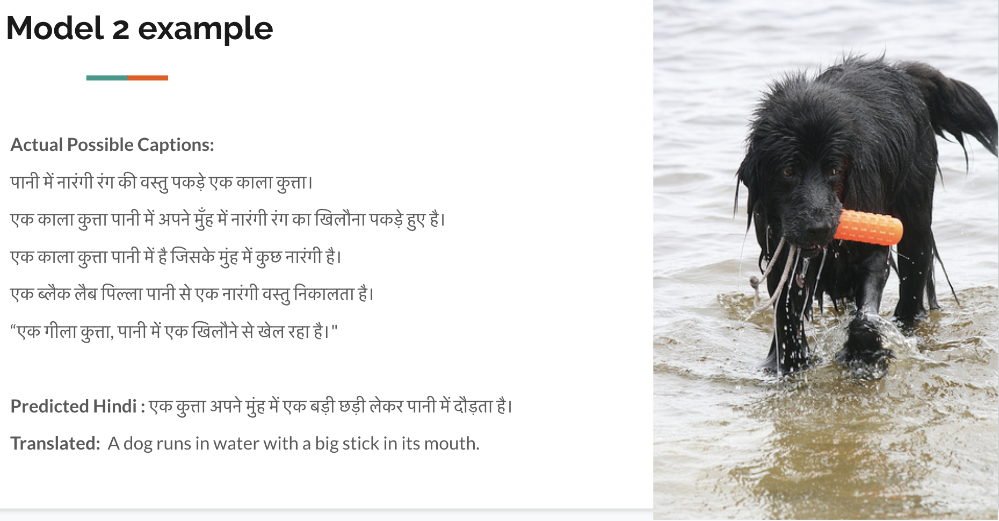

From the above image we can see that ResNet model has correctly predicted the caption. 

### For VGG model
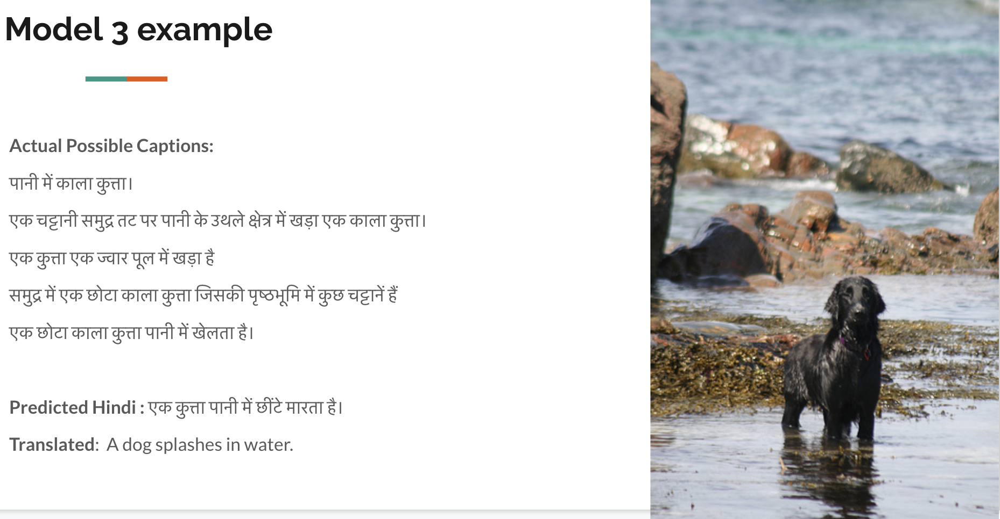

From the above image we can see that the model not only corrreclty detects the dog but the surroundings as well along with appropriate verbs, (splashes, water)

### For VGG Model (Failed prediction sample)
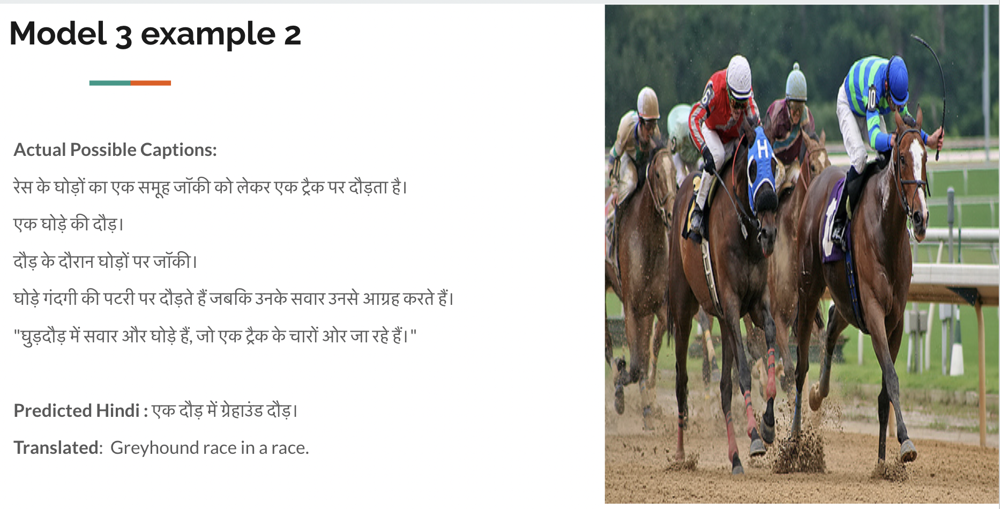

**From the above image we can see that the model has failed to predict the Hindi word for "Horse" as it is not present in the vocabulary. To solve similar problems we curate our own dataset.**

# Qualitative Results (For Finetuning Experiments)

### Note: This sample output is present in this notebook (scroll downwards)
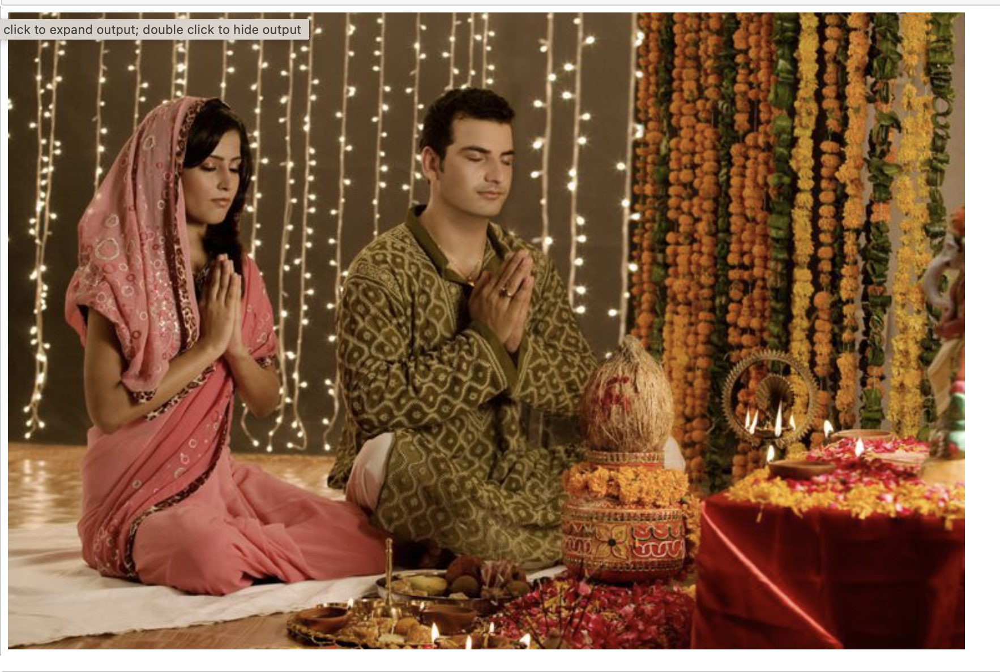

- **Ground Truth :** पूजा के दौरान प्रार्थना करते युगल (couple praying during worship)
- **Baseline Result:** एक महिला और एक महिला एक दूसरे को गले लगाते हुए एक दूसरे को देख रहे हों (A woman and a woman hugging each other looking at each other)
- **Finetuned model result: एक दूल्हा और एक महिला एक साथ पोज देती हैं। (A groom and a woman pose together.)**

### Analysis
From the above predictions, we can see that the model finetuned with Hindi-Captions in Indian context predicts a much better caption compared to the baseline model.

## Failed Experiments - CLIP model (Sayali)
We planned to explored objection detection networks with transformer architecture (CLIP model) to improve the images features and hence the BLEU score. CLIP model is Trained on large datasets, capable of generating semantic encodings. We experimented with  the existing FLAX version of  CLIP + MBART (pretrained model checkpoint), but several CUDA-jax incompatibility issues.

### Below we provide the code for evaluating our models on the baseline VGG and Finetuned VGG. We use our custom test dataset to generate BLEU score and model predictions.

In [ ]:
from numpy import argmax
from pickle import load
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import load_model
from nltk.translate.bleu_score import corpus_bleu
from IPython.display import Image

In [2]:
def LoadDoc(file_name):
        file = open(file_name, 'r', encoding = "utf-8")
        text = file.read()
        file.close()
        return text

In [3]:
def LoadCleanDescription(file_name):
    document = LoadDoc(file_name)
    descriptions = dict()
    i = 0
    for l in document.split('\n'):
        if len(l)<1:
            break
        i +=1
        if i == 1:
            continue
        tokens = l.split(',')
        imageId, imageDesc = tokens[0], tokens[1].split()
        if imageId not in descriptions:
            descriptions[imageId] = list()
        desc = 'startseq ' + ' '.join(imageDesc) + ' endseq'
        descriptions[imageId].append(desc)
    return descriptions

In [4]:
def LoadPhotoFeatures(file_name, dataset, indian):
    AllFeatures = load(open(file_name, 'rb'))
    features = {}
    for k in dataset:
        if k.split(".")[0] in AllFeatures.keys():
            features[k[:-4]] = AllFeatures[k[:-4]]
    #features = { k[:-4]: AllFeatures[k[:-4]] for k in dataset}
    return features

In [5]:
def LoadPhotoFeatures_2(file_name, dataset, indian):
    AllFeatures = load(open(file_name, 'rb'))
    features = {}
    for k in dataset:
        if k.split(".")[0] in AllFeatures.keys():
            features[k.split(".")[0]] = AllFeatures[k.split(".")[0]]
    #features = { k[:-4]: AllFeatures[k[:-4]] for k in dataset}
    return features

In [6]:
def ToLines(desc):
    all_desc = list()
    for key in desc.keys():
        [all_desc.append(d) for d in desc[key]]
    return all_desc

In [7]:
def CreateTokenizer(desc):
    l = ToLines(desc)
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(l)
    return tokenizer

In [8]:
def WordForId(integer, tokenizer):
    for w, i in tokenizer.word_index.items():
        if i == integer:
            return w
    return None

def maxLength(descs):
    lines = ToLines(descs)
    return max(len(d.split()) for d in lines)

In [9]:
# generate a description for an image
def GenerateDesc(model, tokenizer, image, maxLength):
        start_text = 'startseq'
        for i in range(maxLength):
                seq = tokenizer.texts_to_sequences([start_text])[0]
                seq = pad_sequences([seq], maxlen=maxLength)
                yword = model.predict([image,seq], verbose=0,workers=6, use_multiprocessing=True)
                yword = argmax(yword)
                word = WordForId(yword, tokenizer)
                if word is None:
                        break
                start_text += ' ' + word
                if word == 'endseq':
                        break
        return start_text

In [10]:
def EvaluateModel(model, descs, images, tokenizer, maxLength):
    y, yhat = list(), list()
    i = 0
    for key, desc_list in descs.items():
        yword = GenerateDesc(model, tokenizer, images[key.split(".")[0]], maxLength)
#         pred_file.write(" ".join(yword)+" \n")
        references = [d.split() for d in desc_list]
        y.append(references)
        yhat.append(yword.split())
        if i!=0 and i%10==0:
            print('BLEU-1: %f' % corpus_bleu(y, yhat, weights=(1.0, 0, 0, 0)))
        i=i+1
    print('BLEU-1: %f' % corpus_bleu(y, yhat, weights=(1.0, 0, 0, 0)))
    print('BLEU-2: %f' % corpus_bleu(y, yhat, weights=(0.5, 0.5, 0, 0)))

In [11]:
def PredictModel(model, descs, images, tokenizer, maxLength):
    y, yhat = list(), list()
    key = "people_doing_indian_puja_Image_1.jpg"
    yword = GenerateDesc(model, tokenizer, images[key.split(".")[0]], maxLength)
    references = [d.split() for d in descs[key]]
    print(key)
    print(yword)
    print(references)

In [12]:
test_descriptions = LoadCleanDescription('../input/d/sayalighodekar/ic-test/ic_test.csv')
test_features = LoadPhotoFeatures('../input/india-vgg16/india_VGG16features.pkl', test_descriptions, True)

In [14]:
model = load_model('../input/vgg16-5-captions/vgg16_5_captions')
model.summary()

2021-12-15 00:29:01.218847: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-15 00:29:01.322470: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-15 00:29:01.323261: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-15 00:29:01.324452: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 38)]         0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 38, 50)       350300      input_2[0][0]                    
__________________________________________________________________________________________________
input_1 (InputLayer)            [(None, 4096)]       0                                            
__________________________________________________________________________________________________
dropout_2 (Dropout)             (None, 38, 50)       0           embedding_1[0][0]                
____________________________________________________________________________________________

In [15]:
# train_descriptions = LoadCleanDescription('../input/ic-train/ic_train.csv')
# train_descriptions_set_2 = LoadCleanDescription('../input/ic-train/ic_train.csv')
# train_descriptions_set_1 = LoadCleanDescription('../input/combined-train-val/combined_train_val.csv')
# train_descriptions = LoadCleanDescription('../input/combined-train-val/combined_train_val.csv')
# train_descriptions = {**train_descriptions_set_1 ,** train_descriptions_set_2}
train_descriptions = LoadCleanDescription('/kaggle/input/setfiles/train_file.tsv')
#valid_descriptions = LoadCleanDescription('../valid_file.tsv')
# train_descriptions.pop('image_file')
print('Descriptions:',len(train_descriptions))
tokenizer = CreateTokenizer(train_descriptions)
vocabSize = len(tokenizer.word_index) + 1
print('Vocabulary Size: %d' % vocabSize)
# determine the maximum sequence length
max_len = maxLength(train_descriptions)
print('Description Length: %d' % max_len)

Descriptions: 4854
Vocabulary Size: 7006
Description Length: 38


In [16]:
EvaluateModel(model, test_descriptions, test_features, tokenizer, max_len)

2021-12-15 00:29:08.943517: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


BLEU-1: 0.219512
BLEU-2: 0.053743


/opt/conda/lib/python3.7/site-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 3-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


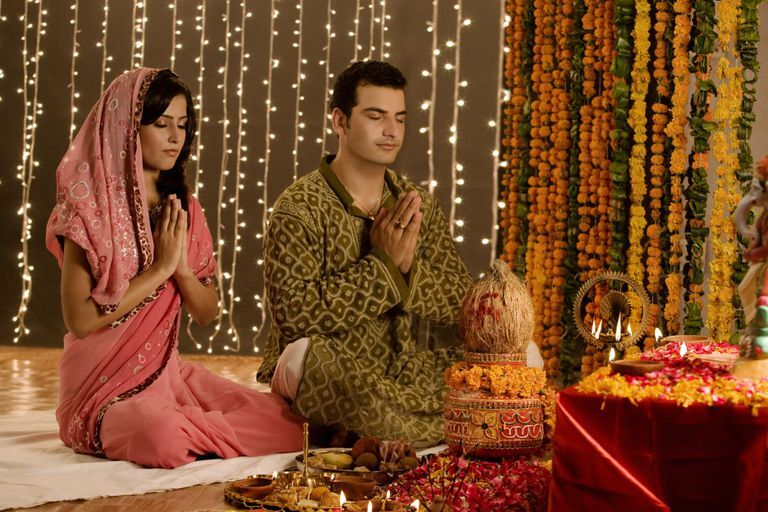

In [18]:
Image("../input/dlcv-indian-images/people_doing_indian_puja_Image_1.jpeg")


In [19]:
PredictModel(model, test_descriptions, test_features, tokenizer, max_len)

people_doing_indian_puja_Image_1.jpg
startseq एक महिला और एक महिला एक दूसरे को गले लगाते हुए एक दूसरे को देख रहे हों। हैं। endseq
[['startseq', 'पूजा', 'के', 'दौरान', 'प्रार्थना', 'करते', 'युगल।', 'endseq']]


In [21]:
model = load_model('../input/indianvggmodel/indian_images_vgg_captions')
model.summary()

2021-12-15 00:29:22.743930: W tensorflow/core/common_runtime/graph_constructor.cc:803] Node 'cond/while' has 13 outputs but the _output_shapes attribute specifies shapes for 46 outputs. Output shapes may be inaccurate.
2021-12-15 00:29:23.741843: W tensorflow/core/common_runtime/graph_constructor.cc:803] Node 'cond/while' has 13 outputs but the _output_shapes attribute specifies shapes for 46 outputs. Output shapes may be inaccurate.
2021-12-15 00:29:23.928936: W tensorflow/core/common_runtime/graph_constructor.cc:803] Node 'cond' has 5 outputs but the _output_shapes attribute specifies shapes for 46 outputs. Output shapes may be inaccurate.
2021-12-15 00:29:24.030712: W tensorflow/core/common_runtime/graph_constructor.cc:803] Node 'cond/while' has 13 outputs but the _output_shapes attribute specifies shapes for 46 outputs. Output shapes may be inaccurate.
2021-12-15 00:29:24.080989: W tensorflow/core/common_runtime/graph_constructor.cc:803] Node 'cond/while' has 13 outputs but the _ou

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 40)]         0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 40, 50)       403100      input_2[0][0]                    
__________________________________________________________________________________________________
input_1 (InputLayer)            [(None, 4096)]       0                                            
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 40, 50)       0           embedding[0][0]                  
______________________________________________________________________________________________

In [22]:
# train_descriptions = LoadCleanDescription('../input/ic-train/ic_train.csv')
train_descriptions_set_2 = LoadCleanDescription('../input/ic-train/ic_train.csv')
train_descriptions_set_1 = LoadCleanDescription('../input/combined-train-val/combined_train_val.csv')

train_descriptions = {**train_descriptions_set_1 ,** train_descriptions_set_2}
# test_descriptions = LoadCleanDescription('/kaggle/input/setfiles/test_file.tsv')
#valid_descriptions = LoadCleanDescription('../valid_file.tsv')
train_descriptions.pop('image_file')
print('Descriptions:',len(train_descriptions))
tokenizer = CreateTokenizer(train_descriptions)
vocabSize = len(tokenizer.word_index) + 1
print('Vocabulary Size: %d' % vocabSize)
# determine the maximum sequence length
max_len = maxLength(train_descriptions)
print('Description Length: %d' % max_len)

Descriptions: 6562
Vocabulary Size: 8062
Description Length: 40


In [23]:
EvaluateModel(model, test_descriptions, test_features, tokenizer, max_len)

BLEU-1: 0.280488
BLEU-2: 0.085914


In [25]:
PredictModel(model, test_descriptions, test_features, tokenizer, max_len)

people_doing_indian_puja_Image_1.jpg
startseq एक दूल्हा और एक महिला एक साथ पोज देती हैं। endseq
[['startseq', 'पूजा', 'के', 'दौरान', 'प्रार्थना', 'करते', 'युगल।', 'endseq']]
